In [1]:
import sys
print(sys.path)
from arnie.mfe import mfe
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt 
nan = np.nan

['/Users/jgc/Desktop/SSRP_research', '', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages', '/Users/jgc/Desktop/SSRP_research/packages', '/Users/jgc/Desktop/SSRP_research', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python37.zip', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/lib-dynload', '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/extensions', '/Users/jgc/.ipython']


In [2]:
def new_import(file_name):
    shape_fname = file_name 
    f = open(shape_fname)
    shape_lines= f.readlines()
    f.close()
    return shape_lines

In [3]:
#importing file with genome nucleotide (Note thiscode has 'T')

f = open('refseq.txt')
lines = f.readlines()
f.close()
whole_genome = lines[0].strip('\n')


In [4]:
def shape_lines_unnorm(shape_lines):
    all_shape_lines_no_nan = []
    for number in shape_lines:
        if number == '-999\n':
            all_shape_lines_no_nan.append('nan')
        elif number =='nan\n':
             all_shape_lines_no_nan.append('nan')
        elif number =='nan': #line added for 'nan' in dms shape
             all_shape_lines_no_nan.append('nan')
        else:
            all_shape_lines_no_nan.append(number)   
    float_lines=[float(i) for i in all_shape_lines_no_nan]
    return (float_lines)

In [5]:
def normalize_shape(shape_reacs):
    shape_reacs = np.array(shape_reacs)

    # Get rid of nan values for now
    nonan_shape_reacs = shape_reacs[~np.isnan(shape_reacs)]

    # Find Filter 1: 1.5 * Inter-Quartile Range
    sorted_shape = np.sort(nonan_shape_reacs)
    q1 = sorted_shape[int(0.25 * len(sorted_shape))]
    q3 = sorted_shape[int(0.75 * len(sorted_shape))]
    iq_range = abs(q3 - q1)
    filter1 = next(x for x, val in \
        enumerate(list(sorted_shape)) if val > 1.5 * iq_range)

    # Find Filter 2: 95% value
    filter2 = int(0.95 * len(sorted_shape))

    # Get maximum filter value and fiter data
    filter_cutoff = sorted_shape[max(filter1, filter2)]
    sorted_shape = sorted_shape[sorted_shape < filter_cutoff]

    # Scalefactor: Mean of top 10th percentile of values
    top90 = sorted_shape[int(0.9 * len(sorted_shape))]
    scalefactor = np.mean(sorted_shape[sorted_shape > top90])
        
    # Scale dataset
    return shape_reacs/scalefactor

In [6]:
def shape_norm_for_heatmap(shape_norm):
    all_shape_lines_no_nan = []
    for number in shape_norm:
        if number < 0:
            all_shape_lines_no_nan.append(0)
        elif number > 2:
            all_shape_lines_no_nan.append(2)
        #elif number > '10': #if number is over 10 for some reason program was ignoring it (eg. das)
            #all_shape_lines_no_nan.append(2)
        else:
            all_shape_lines_no_nan.append(number)   
    float_lines=[float(i) for i in all_shape_lines_no_nan]
    return (float_lines)

In [7]:
def function_for_heatmap_data(shape_lines):
    shape_lines_unnormalize = shape_lines_unnorm(shape_lines) 
    shape_lines_norm = normalize_shape(shape_lines_unnormalize)
    shape_norm_for_heatmap_var = shape_norm_for_heatmap(shape_lines_norm)
    return shape_norm_for_heatmap_var

In [8]:
def sequence_no_T(sequence):
    reactivity_no_GU= []
    for idx in range(0, len(sequence)):
        if sequence[idx] =='T':
            reactivity_no_GU.append('U')
        else:
            reactivity_no_GU.append(sequence[idx])
    return reactivity_no_GU

In [9]:
def bp_func(dot_bracket):
    struct_sim= []
    for idx in range(0, len(dot_bracket)):
        if dot_bracket[idx] == ".":
            struct_sim.append(1) #1 means base is unpaired
        else:
            struct_sim.append(0) #0 means base is paired
    return(struct_sim)

In [10]:
def covert_conservation_to_floats(conservation_lines):
    conservation_numbers = []
    for number in conservation_lines:
        if number == '\ufeff1\n':
            conservation_numbers.append(1)
        else:
            conservation_numbers.append(number)   
    float_lines=[float(i) for i in conservation_numbers]
    return (float_lines)

## SHAPE DATASETS 5'UTR

In [11]:
shape_lines_5utr_das_trs = new_import('5utr_das_trs.csv')
shape_norm_5utr_das= function_for_heatmap_data(shape_lines_5utr_das_trs)

In [12]:
shape_lines_5utr_incarnato = new_import('5utr_incarnato.csv')
shape_norm_5utr_incarnato = function_for_heatmap_data(shape_lines_5utr_incarnato)


In [13]:
shape_lines_5utr_pyle = new_import('5utr_pyle.csv')
shape_norm_5utr_pyle = function_for_heatmap_data(shape_lines_5utr_pyle)


In [14]:
shape_lines_5utr_weeks = new_import('5utr_weeks.csv')
shape_norm_5utr_weeks = function_for_heatmap_data(shape_lines_5utr_weeks)


In [15]:
#Rouskin DMS data: replace G & T shape valueswith 'nan'

In [16]:
shape_lines_5utr_rouskin = new_import('5utr_rouskin.csv')
sequence_5utr = whole_genome[0:450]

In [17]:
def dms_shape(sequence,shape_lines):
    reactivity_no_GU= []
    for idx in range(0, len(sequence)):
        if sequence[idx] =='G':
            reactivity_no_GU.append('nan\n')
        elif sequence[idx]=='T':
            reactivity_no_GU.append('nan\n')
        else:
            reactivity_no_GU.append(shape_lines[idx])
    return reactivity_no_GU

In [18]:
rouskin_dms_shape_lines = dms_shape(sequence_5utr,shape_lines_5utr_rouskin)
shape_norm_5utr_rouskin = function_for_heatmap_data(rouskin_dms_shape_lines)


In [19]:
shape_lines_5utr_zhang_invivo= new_import('5utr_zhang_invivo.csv') 
shape_norm_for_heatmap_5utr_zhang_invivo=function_for_heatmap_data(shape_lines_5utr_zhang_invivo)


In [20]:
shape_lines_5utr_zhang_invitro= new_import('5utr_zhang_invitro.csv') 
shape_norm_for_heatmap_5utr_zhang_invitro=function_for_heatmap_data(shape_lines_5utr_zhang_invitro)


In [21]:
## adding Das lab data SL2-6

In [22]:
shape_lines_5utr_das_sl26 = new_import('5utr_das_sl26.csv') 
shape_norm_for_heatmap_5utr_das_sl26=function_for_heatmap_data(shape_lines_5utr_das_sl26)


In [23]:
def new_sl26_func(list_a):
    das_SL_list=[]
    for number in list_a:
        das_SL_list.append(nan)
    return(das_SL_list)

In [24]:
list_a =list(range(1,101))
new_list_a=new_sl26_func(list_a)


In [25]:
new_sl26_list= new_list_a[0:44] + shape_norm_for_heatmap_5utr_das_sl26 + new_list_a + new_list_a[0:6]


In [26]:
#x-axis
sequence_5utr_no_T = sequence_no_T(sequence_5utr)
position_5utr=list(range(1,451))
xaxis_5utr = [''.join([sequence_5utr_no_T[i], str(position_5utr[i])]) for i in range(0, len(sequence_5utr_no_T))]


In [27]:
dot_bracket_5utr = "......(((((.(((((....)))))..)))))...(((((((.(((((.....))))).((((.......))))........((((((((.((.((((.(((.....))).)))))).))))))))....((((.....)))).(((((((((((((((..(((((...(((.(((((((.(((..((((((.(((((......)))))..))))))......)))(((((((.((......)))))))))(((....))).)))))))))).))))).))))...)))))))..................))))..((((((...)))))).(((((.((((....(((((.(((((((((((((.....))).)))))..))))).)))))...(((((...))))))))))))))........))))))).....(((.....)))"

In [28]:
bp_heatmap_5utr = bp_func(dot_bracket_5utr)


In [29]:
LNA3=list(range(190,215)) #190-214
LNA6=list(range(44,88)) #44-87
LNA7=list(range(292,323)) #292-322
LNA8=list(range(235,256)) #235-255
LNA14=list(range(258,277)) #258-276

In [30]:
def suplot_lna(position_5utr):
    new_number=[]
    for number in position_5utr:
    #for number in range(0, len(position_5utr)):
        #new_number=[]
        if number==number in LNA3:
            new_number.append(1)
        elif number == number in LNA6:
            new_number.append(1)
        elif number == number in LNA7:
            new_number.append(1)
        elif number == number in LNA8:
            new_number.append(1)
        elif number == number in LNA14:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [31]:
subplot_5utr_lna = suplot_lna(position_5utr)


In [32]:
sars_conservation_lines = new_import('sarsr_conservation.csv') 


In [33]:
conservation_floats = covert_conservation_to_floats(sars_conservation_lines)
conservation_5utr = conservation_floats[0:450]


In [34]:
#punp track 5UTR
punp_lines_contrafold= new_import('contrafold.csv') 
punp_lines_eternafold= new_import('eternafold.csv') 
punp_lines_vienna_2 = new_import('vienna_2.csv') 


In [35]:
def punp_float(lines):
    float_lines_list = []
    for number in lines:  
        float_lines_list.append(number)
    
    float_lines=[float(i) for i in float_lines_list]
    return float_lines

In [36]:
punp_track_contrafold = punp_float(punp_lines_contrafold)
punp_track_eternafold = punp_float(punp_lines_eternafold)
punp_track_vienna_2 = punp_float(punp_lines_vienna_2)

In [37]:
punp_track_contrafold_5utr = punp_track_contrafold[0:450]
punp_track_eternafold_5utr = punp_track_eternafold[0:450]
punp_track_vienna_2_5utr = punp_track_vienna_2[0:450]


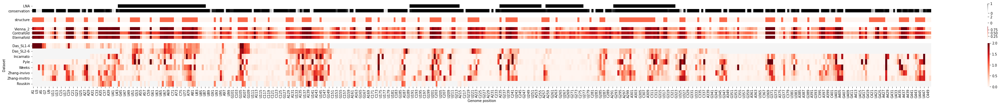

In [40]:
#5'utr range: 1-450 [0:450] 
data1 =shape_norm_5utr_das
data2 =new_sl26_list
data3 =shape_norm_5utr_incarnato
data4 =shape_norm_5utr_pyle
data5 =shape_norm_5utr_weeks
data6 =shape_norm_for_heatmap_5utr_zhang_invivo
data7 =shape_norm_for_heatmap_5utr_zhang_invitro
data8 =shape_norm_5utr_rouskin

data = np.array([data1, data2, data3, data4, data5, data6, data7, data8]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["Das_SL1-4", "Das_SL2-6", "Incarnato", "Pyle", "Weeks", "Zhang-invivo", "Zhang-invitro","Rouskin"], \
			columns=xaxis_5utr)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray

fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1.1, .7, 1.5, 5]},figsize=(60, 5))

#LNA and conservation track
lna_conservation_data = np.array([subplot_5utr_lna, conservation_5utr]) 
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["LNA","conservation"], \
			columns=xaxis_5utr)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
    

#Structure track
structures_data = np.array([bp_heatmap_5utr]) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=xaxis_5utr)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

#New track:p(unp) track
punp_data = np.array([punp_track_vienna_2_5utr, punp_track_contrafold_5utr, punp_track_eternafold_5utr]) 
punp_data_df = pd.DataFrame(data=punp_data, \
			index=["Vienna_2", "Contrafold", "Eternafold"], \
			columns=xaxis_5utr)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
for i in range(punp_data_df.shape[0] + 1):
	ax[2].axhline(i, color='white', lw=4)

heat_map= sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)

#plt.savefig('heatmap_5utr_punp.pdf')

plt.show()

## FSE

In [41]:
sequence_fse = whole_genome[13458:13546]


In [42]:
shape_lines_fse_incarnato = new_import('fse_incarnato.csv') 
shape_norm_for_heatmap_fse_incarnato=function_for_heatmap_data(shape_lines_fse_incarnato)


In [43]:
shape_lines_fse_pyle = new_import('fse_pyle.csv') 
shape_norm_for_heatmap_fse_pyle=function_for_heatmap_data(shape_lines_fse_pyle)


In [44]:
shape_lines_fse_vanya = new_import('fse_vanya.csv') 
shape_norm_for_heatmap_fse_vanya=function_for_heatmap_data(shape_lines_fse_vanya)


In [45]:
shape_lines_fse_ann_vanya = new_import('fse_ann_vanya_plusfse.csv') 
shape_norm_for_heatmap_fse_ann_vanya=function_for_heatmap_data(shape_lines_fse_ann_vanya)


In [46]:
shape_lines_fse_weeks = new_import('fse_weeks.csv') 
shape_norm_for_heatmap_fse_weeks=function_for_heatmap_data(shape_lines_fse_weeks)


In [47]:
shape_lines_fse_rouskin= new_import('fse_rouskin.csv') #DMS data
rouskin_dms_shape_lines_fse = dms_shape(sequence_fse,shape_lines_fse_rouskin)
shape_norm_for_heatmap_fse_rouskin=function_for_heatmap_data(rouskin_dms_shape_lines_fse)


In [48]:
shape_lines_fse_zhang_invivo= new_import('fse_zhang_invivo.csv') 
shape_norm_for_heatmap_fse_zhang_invivo=function_for_heatmap_data(shape_lines_fse_zhang_invivo)


In [49]:
shape_lines_fse_zhang_invitro= new_import('fse_zhang_invitro.csv') 
shape_norm_for_heatmap_fse_zhang_invitro=function_for_heatmap_data(shape_lines_fse_zhang_invitro)


In [50]:
#add m2seq data
shape_lines_fse_das_m2seq= new_import('fse_vanya_m2seq.csv') 
shape_norm_for_heatmap_fse_das_m2seq=function_for_heatmap_data(shape_lines_fse_das_m2seq)


In [51]:
#Conservation track
conservation_fse = conservation_floats[13458:13546]


In [52]:
#structure track
structure_fse ="................((((((((((....[[[[..))))))))))(((((((((.........))).)))))).....]]]]....."
strucure_track_fse = bp_func(structure_fse)

In [53]:
#xaxis
sequence_fse_no_T = sequence_no_T(sequence_fse)
position_fse=list(range(13459,13547))
fse_xaxis= [''.join([sequence_fse_no_T[i], str(position_fse[i])]) for i in range(0, len(sequence_fse))]


In [54]:
#punp for FSE range
punp_track_contrafold_fse = punp_track_contrafold[13458:13546]
punp_track_eternafold_fse = punp_track_eternafold[13458:13546]
punp_track_vienna_2_fse = punp_track_vienna_2[13458:13546]


<function matplotlib.pyplot.show(*args, **kw)>

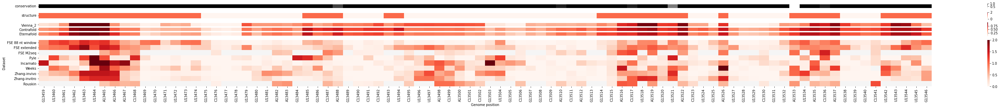

In [55]:
#FSE range: 13459-13546 [13458:13546]
data1 = shape_norm_for_heatmap_fse_vanya # change name to FSE 85 nt window
data2 = shape_norm_for_heatmap_fse_ann_vanya
data3 = shape_norm_for_heatmap_fse_das_m2seq
data4 = shape_norm_for_heatmap_fse_pyle
data5 = shape_norm_for_heatmap_fse_incarnato
data6 = shape_norm_for_heatmap_fse_weeks
data7 = shape_norm_for_heatmap_fse_zhang_invivo
data8 = shape_norm_for_heatmap_fse_zhang_invitro
data9 = shape_norm_for_heatmap_fse_rouskin
data = np.array([data1, data2, data3, data4, data5, data6, data7, data8, data9]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["FSE 88 nt window", "FSE extended", "FSE M2seq", "Pyle", 'Incarnato', 'Weeks', "Zhang-invivo", "Zhang-invitro","Rouskin" ], \
			columns= fse_xaxis)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray

fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [.55, .7, 1.5, 5]},figsize=(60, 5))

#LNA and conservation track
lna_conservation_data = np.array([conservation_fse]) 
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["conservation"], \
			columns=fse_xaxis)
fig.subplots_adjust(wspace=0.01)
lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)
   

#Structure track
structures_data = np.array([strucure_track_fse]) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=fse_xaxis)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

#New track:p(unp) track
punp_data = np.array([punp_track_vienna_2_fse, punp_track_contrafold_fse, punp_track_eternafold_fse]) 
punp_data_df = pd.DataFrame(data=punp_data, \
			index=["Vienna_2", "Contrafold", "Eternafold"], \
			columns=fse_xaxis)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
for i in range(punp_data_df.shape[0] + 1):
	ax[2].axhline(i, color='white', lw=4)

sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)

#plt.savefig('heatmap_fse_punp.pdf')
plt.show

In [56]:
#Heatmaps ID regions

In [57]:
#mid4 genome wide data
shape_lines_incarnato = new_import('incarnato_normalized_reactivity.csv')
shape_lines_pyle = new_import('pyle_normalized_reactivity.csv')
shape_lines_zhang_invivo = new_import('zhang_invivo_normalized_reactivity.csv')
shape_lines_zhang_invitro = new_import('zhang_invitro_normalized_reactivity.csv') 

In [58]:
#mid4_region 10424:10555
shape_lines_mid4_incarnato = shape_lines_incarnato[10423:10555]
shape_norm_for_heatmap_mid4_incarnato=function_for_heatmap_data(shape_lines_mid4_incarnato)

shape_lines_mid4_pyle = shape_lines_pyle[10423:10555]
shape_norm_for_heatmap_mid4_pyle=function_for_heatmap_data(shape_lines_mid4_pyle)


shape_lines_mid4_zhang_invivo = shape_lines_zhang_invivo[10423:10555]
shape_norm_for_heatmap_mid4_zhang_invivo=function_for_heatmap_data(shape_lines_mid4_zhang_invivo)

shape_lines_mid4_zhang_invitro = shape_lines_zhang_invitro[10423:10555]
shape_norm_for_heatmap_mid4_zhang_invitro=function_for_heatmap_data(shape_lines_mid4_zhang_invitro)




In [59]:
#Das lab windowed data
shape_lines_mid4_das = new_import('mid4_vanya.csv') 
shape_norm_for_heatmap_mid4_das=function_for_heatmap_data(shape_lines_mid4_das)


In [60]:
#LNA
##mid4: 10424-10555 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_18= list(range(10483,10504))
position_mid4=list(range(10424,10556))


In [61]:
def suplot_lna_mid4(position):
    new_number=[]
    for number in position:
        if number==number in lna_18:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [62]:
mid4_lna = suplot_lna_mid4(position_mid4)


In [63]:
#Conservation
conservation_mid4 = conservation_floats[10423:10555]


In [64]:
#Structure track
mid4_windowed = '((((...................(((.(.....(((((((((((.....))))))))))).....)))).(((((......)))))...............................))))...........'
structure_track_mid4 = bp_func(mid4_windowed)


In [65]:
#x_axis for mid4
sequence_mid4 = whole_genome[10423:10555]
sequence_mid4_no_T = sequence_no_T(sequence_mid4)
xaxis_mid4 = [''.join([sequence_mid4_no_T[i], str(position_mid4[i])]) for i in range(0, len(sequence_mid4_no_T))]

In [66]:
#punp for mid4 range
punp_track_contrafold_mid4 = punp_track_contrafold[10423:10555]
punp_track_eternafold_mid4 = punp_track_eternafold[10423:10555]
punp_track_vienna_2_mid4 = punp_track_vienna_2[10423:10555]

In [67]:
def function_for_mid_heatmaps():
    data = np.array([data1, data2, data3, data4, data5]) # First make a numpy array with your data

    # Move the data from a numpy array to a DataFrame with row and column labels
    data_df = pd.DataFrame(data=data, \
                index=["Das", "Pyle", "Incarnato", "Zhang-invivo", "Zhang-invitro"], \
                columns=xaxis)
    mask = data_df.isnull() # Create a mask for all the "nan" values

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray

    fig,ax = plt.subplots(4, 1, gridspec_kw={'height_ratios': [1.1, .7, 1.5, 5]},figsize=(60, 5))

    #LNA and conservation track
    lna_conservation_data = np.array([lna, conservation]) 
    lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
                index=["lna", "conservation"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    lna_conserv_heatmap= sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
    for i in range(lna_conservation_data_df.shape[0] + 1):
        ax[0].axhline(i, color='white', lw=4)
    lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)


    #Structure track
    structures_data = np.array([structure]) 
    structures_data_df = pd.DataFrame(data=structures_data, \
                index=["structure"], \
                columns=xaxis)

    fig.subplots_adjust(wspace=0.01)
    struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
    for i in range(structures_data_df.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)
    struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)

    #New track:p(unp) track
    punp_data = np.array([vienna_2, contrafold, eternafold]) 
    punp_data_df = pd.DataFrame(data=punp_data, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    sns.heatmap(punp_data_df, cmap='Reds', ax=ax[2], xticklabels=False)
    for i in range(punp_data_df.shape[0] + 1):
        ax[2].axhline(i, color='white', lw=4)

    sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[3])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    plt.xlabel("Genome position") # X axis label
    plt.ylabel("Dataset") # Y axis label
    plt.gcf().subplots_adjust(bottom=0.19)


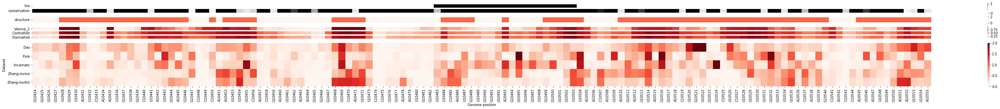

In [68]:
#mid4 range: 10424-10555 [10423:10555]

data1 = shape_norm_for_heatmap_mid4_das
data2 = shape_norm_for_heatmap_mid4_pyle
data3 = shape_norm_for_heatmap_mid4_incarnato
data4 = shape_norm_for_heatmap_mid4_zhang_invivo
data5 = shape_norm_for_heatmap_mid4_zhang_invitro
xaxis = xaxis_mid4
lna = mid4_lna
conservation = conservation_mid4
structure = structure_track_mid4
vienna_2 = punp_track_vienna_2_mid4
contrafold = punp_track_contrafold_mid4
eternafold = punp_track_eternafold_mid4

function_for_mid_heatmaps()
#plt.savefig('heatmap_mid4_punp.pdf')


In [69]:
#mid7_region:28712-28851
shape_lines_mid7_incarnato = shape_lines_incarnato[28711:28851]
shape_norm_for_heatmap_mid7_incarnato=function_for_heatmap_data(shape_lines_mid7_incarnato)

shape_lines_mid7_pyle = shape_lines_pyle[28711:28851]
shape_norm_for_heatmap_mid7_pyle=function_for_heatmap_data(shape_lines_mid7_pyle)

shape_lines_mid7_zhang_invivo = shape_lines_zhang_invivo[28711:28851]
shape_norm_for_heatmap_mid7_zhang_invivo=function_for_heatmap_data(shape_lines_mid7_zhang_invivo)

shape_lines_mid7_zhang_invitro = shape_lines_zhang_invitro[28711:28851]
shape_norm_for_heatmap_mid7_zhang_invitro=function_for_heatmap_data(shape_lines_mid7_zhang_invitro)


In [70]:
#Windowed data
shape_lines_mid7_das = new_import('mid7_vanya.csv') 
shape_norm_for_heatmap_mid7_das=function_for_heatmap_data(shape_lines_mid7_das)


In [71]:
#xaxis for mid 7 #mid7_region:28712-28851
#mid8_region: 28979-29118
sequence_mid7 = whole_genome[28711:28851]
print(sequence_mid7)

position_mid7=list(range(28712,28852))
print(position_mid7)

sequence_mid7_no_T = sequence_no_T(sequence_mid7)
xaxis_mid7 = [''.join([sequence_mid7_no_T[i], str(position_mid7[i])]) for i in range(0, len(sequence_mid7_no_T))]
print(xaxis_mid7)

GGCACCCGCAATCCTGCTAACAATGCTGCAATCGTGCTACAACTTCCTCAAGGAACAACATTGCCAAAAGGCTTCTACGCAGAAGGGAGCAGAGGCGGCAGTCAAGCCTCTTCTCGTTCCTCATCACGTAGTCGCAACAG
[28712, 28713, 28714, 28715, 28716, 28717, 28718, 28719, 28720, 28721, 28722, 28723, 28724, 28725, 28726, 28727, 28728, 28729, 28730, 28731, 28732, 28733, 28734, 28735, 28736, 28737, 28738, 28739, 28740, 28741, 28742, 28743, 28744, 28745, 28746, 28747, 28748, 28749, 28750, 28751, 28752, 28753, 28754, 28755, 28756, 28757, 28758, 28759, 28760, 28761, 28762, 28763, 28764, 28765, 28766, 28767, 28768, 28769, 28770, 28771, 28772, 28773, 28774, 28775, 28776, 28777, 28778, 28779, 28780, 28781, 28782, 28783, 28784, 28785, 28786, 28787, 28788, 28789, 28790, 28791, 28792, 28793, 28794, 28795, 28796, 28797, 28798, 28799, 28800, 28801, 28802, 28803, 28804, 28805, 28806, 28807, 28808, 28809, 28810, 28811, 28812, 28813, 28814, 28815, 28816, 28817, 28818, 28819, 28820, 28821, 28822, 28823, 28824, 28825, 28826, 28827, 28828, 28829, 28830, 28831, 28832, 28833, 2883

In [72]:
#LNA
#mid7_region:28712-28851 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_12= list(range(28743,28793))

In [73]:
def suplot_lna_new(position,lna):
    new_number=[]
    for number in position:
        if number==number in lna:
            new_number.append(1)
        else:
            new_number.append(0)
    return new_number

In [74]:
mid7_lna = suplot_lna_new(position_mid7,lna_12)


In [75]:
#Conservation
conservation_mid7 = conservation_floats[28711:28851]

In [76]:
#Structure
mid7_windowed = ('((((........((.............((......))..............))........)))).....((..(((((..((.(((((((((((.(((......))).))))).))))))..)).)))))..)).....')
structure_track_mid7 = bp_func(mid7_windowed)

In [77]:
##punp for mid7 range
punp_track_contrafold_mid7 = punp_track_contrafold[28711:28851]
punp_track_eternafold_mid7 = punp_track_eternafold[28711:28851]
punp_track_vienna_2_mid7 = punp_track_vienna_2[28711:28851]


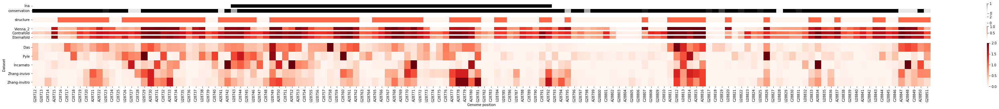

In [78]:
data1 = shape_norm_for_heatmap_mid7_das
data2 =shape_norm_for_heatmap_mid7_pyle
data3 =shape_norm_for_heatmap_mid7_incarnato
data4 = shape_norm_for_heatmap_mid7_zhang_invivo
data5 =shape_norm_for_heatmap_mid7_zhang_invitro
xaxis = xaxis_mid7
lna = mid7_lna
conservation = conservation_mid7
structure = structure_track_mid7
vienna_2 = punp_track_vienna_2_mid7
contrafold = punp_track_contrafold_mid7
eternafold = punp_track_eternafold_mid7

function_for_mid_heatmaps()

In [79]:
##mid8_region: 28979-29118
shape_lines_mid8_incarnato = shape_lines_incarnato[28978:29118]
shape_norm_for_heatmap_mid8_incarnato=function_for_heatmap_data(shape_lines_mid8_incarnato)

shape_lines_mid8_pyle = shape_lines_pyle[28978:29118]
shape_norm_for_heatmap_mid8_pyle=function_for_heatmap_data(shape_lines_mid8_pyle)

shape_lines_mid8_zhang_invivo = shape_lines_zhang_invivo[28978:29118]
shape_norm_for_heatmap_mid8_zhang_invivo=function_for_heatmap_data(shape_lines_mid8_zhang_invivo)

shape_lines_mid8_zhang_invitro = shape_lines_zhang_invitro[28978:29118]
shape_norm_for_heatmap_mid8_zhang_invitro=function_for_heatmap_data(shape_lines_mid8_zhang_invitro)



In [80]:
#windowed data
shape_lines_mid8_das = new_import('mid8_vanya.csv') 
shape_norm_for_heatmap_mid8_das=function_for_heatmap_data(shape_lines_mid8_das)


In [81]:
#xaxis
sequence_mid8 = whole_genome[28978:29118]
print(sequence_mid8)

position_mid8=list(range(28979,29119))
print(position_mid8)

sequence_mid8_no_T = sequence_no_T(sequence_mid8)
xaxis_mid8 = [''.join([sequence_mid8_no_T[i], str(position_mid8[i])]) for i in range(0, len(sequence_mid8_no_T))]
print(xaxis_mid8)

GGTAAAGGCCAACAACAACAAGGCCAAACTGTCACTAAGAAATCTGCTGCTGAGGCTTCTAAGAAGCCTCGGCAAAAACGTACTGCCACTAAAGCATACAATGTAACACAAGCTTTCGGCAGACGTGGTCCAGAACAAAC
[28979, 28980, 28981, 28982, 28983, 28984, 28985, 28986, 28987, 28988, 28989, 28990, 28991, 28992, 28993, 28994, 28995, 28996, 28997, 28998, 28999, 29000, 29001, 29002, 29003, 29004, 29005, 29006, 29007, 29008, 29009, 29010, 29011, 29012, 29013, 29014, 29015, 29016, 29017, 29018, 29019, 29020, 29021, 29022, 29023, 29024, 29025, 29026, 29027, 29028, 29029, 29030, 29031, 29032, 29033, 29034, 29035, 29036, 29037, 29038, 29039, 29040, 29041, 29042, 29043, 29044, 29045, 29046, 29047, 29048, 29049, 29050, 29051, 29052, 29053, 29054, 29055, 29056, 29057, 29058, 29059, 29060, 29061, 29062, 29063, 29064, 29065, 29066, 29067, 29068, 29069, 29070, 29071, 29072, 29073, 29074, 29075, 29076, 29077, 29078, 29079, 29080, 29081, 29082, 29083, 29084, 29085, 29086, 29087, 29088, 29089, 29090, 29091, 29092, 29093, 29094, 29095, 29096, 29097, 29098, 29099, 29100, 2910

In [82]:
#LNA
#mid8_region: 28979-29118 add lna track ex :LNA3=list(range(190,215)) #190-214
lna_2= list(range(29008,29033))
mid8_lna = suplot_lna_new(position_mid8,lna_2)

In [83]:
#Conservation
conservation_mid8 = conservation_floats[28978:29118]

In [84]:
#Structure
mid8_windowed = ('......((((...........)))).................((((.((((((((((((...))))))))))))...((((.(((((...(((((................))))).)))))))))....))))......')
structure_track_mid8 = bp_func(mid8_windowed)

In [85]:
#punp for mid8 range
punp_track_contrafold_mid8 = punp_track_contrafold[28978:29118]
print(punp_track_contrafold_mid8)
punp_track_eternafold_mid8 = punp_track_eternafold[28978:29118]
print(punp_track_eternafold_mid8)
punp_track_vienna_2_mid8 = punp_track_vienna_2[28978:29118]
print(punp_track_vienna_2_mid8)

[0.465976, 0.479629, 0.565653, 0.950176, 0.958773, 0.901236, 0.431285, 0.247018, 0.23172, 0.31579, 0.831803, 0.930653, 0.888576, 0.936725, 0.971171, 0.941492, 0.969114, 0.984139, 0.948803, 0.965157, 0.952557, 0.477485, 0.467268, 0.488419, 0.540145, 0.957116, 0.967357, 0.912417, 0.760227, 0.771176, 0.780561, 0.834282, 0.79942, 0.864051, 0.936227, 0.939708, 0.974322, 0.85393, 0.777537, 0.895113, 0.930265, 0.967777, 0.856433, 0.823591, 0.777571, 0.802382, 0.834316, 0.512409, 0.331125, 0.314309, 0.338744, 0.297265, 0.253401, 0.175527, 0.175749, 0.233862, 0.264675, 0.353142, 0.492552, 0.866285, 0.986465, 0.918298, 0.545437, 0.42297, 0.3485, 0.273598, 0.255169, 0.285671, 0.29365, 0.309941, 0.286271, 0.255571, 0.294278, 0.588942, 0.978086, 0.978485, 0.970635, 0.713817, 0.557711, 0.428342, 0.516723, 0.920166, 0.453101, 0.28989, 0.231993, 0.23803, 0.478823, 0.979377, 0.920572, 0.987493, 0.688827, 0.548376, 0.49265, 0.286472, 0.339874, 0.857226, 0.8502, 0.897863, 0.897155, 0.994214, 0.984284, 0.

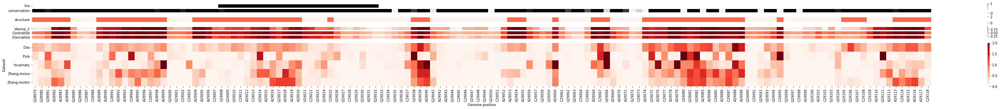

In [86]:
data1 = shape_norm_for_heatmap_mid8_das
data2 =shape_norm_for_heatmap_mid8_pyle
data3 =shape_norm_for_heatmap_mid8_incarnato
data4 = shape_norm_for_heatmap_mid8_zhang_invivo
data5 =shape_norm_for_heatmap_mid8_zhang_invitro
xaxis = xaxis_mid8
lna = mid8_lna
conservation = conservation_mid8
structure = structure_track_mid8
vienna_2 = punp_track_vienna_2_mid8
contrafold = punp_track_contrafold_mid8
eternafold = punp_track_eternafold_mid8

function_for_mid_heatmaps()

In [87]:
#punp for 3utr range: 29543-29903 [29542:29903]
#rearraged order: do above as well later
punp_track_vienna_2_3utr = punp_track_vienna_2[29542:29903]
print(punp_track_vienna_2_3utr)
punp_track_contrafold_3utr = punp_track_contrafold[29542:29903]
print(punp_track_contrafold_3utr)
punp_track_eternafold_3utr = punp_track_eternafold[29542:29903]
print(punp_track_eternafold_3utr)

[0.511165, 0.809274, 0.72871, 0.719382, 0.931063, 0.628296, 0.656104, 0.597609, 0.609358, 0.525865, 0.385214, 0.337132, 0.558108, 0.43225, 0.275422, 0.806934, 0.414962, 0.369341, 0.089981, 0.138192, 0.228263, 0.144839, 0.110519, 0.10208, 0.1071, 0.089708, 0.184277, 0.90432, 0.931287, 0.052795, 0.035178, 0.11581, 0.970771, 0.979651, 0.98698, 0.18392, 0.133439, 0.897628, 0.948445, 0.95641, 0.975446, 0.969649, 0.965187, 0.170151, 0.035734, 0.844713, 0.897892, 0.914799, 0.103419, 0.110261, 0.107459, 0.944668, 0.159216, 0.121724, 0.113304, 0.118086, 0.148649, 0.210996, 0.186327, 0.20169, 0.177291, 0.49735, 0.578773, 0.419996, 0.384036, 0.46218, 0.454065, 0.104682, 0.023534, 0.010153, 0.013887, 0.865418, 0.266433, 0.203375, 0.330449, 0.72919, 0.230078, 0.197255, 0.281518, 0.520521, 0.900878, 0.802616, 0.853529, 0.688822, 0.799437, 0.579372, 0.206657, 0.387967, 0.407716, 0.316014, 0.317014, 0.393594, 0.32376, 0.344933, 0.347235, 0.938275, 0.318053, 0.353539, 0.856437, 0.827778, 0.833442, 0.90

## Whole genome

In [97]:
#datasets
shape_lines_incarnato_whole_genome = shape_lines_incarnato
shape_norm_for_heatmap_incarnato_whole_genome =function_for_heatmap_data(shape_lines_incarnato_whole_genome)

shape_lines_pyle_whole_genome = shape_lines_pyle
shape_norm_for_heatmap_pyle_whole_genome =function_for_heatmap_data(shape_lines_pyle_whole_genome)

shape_lines_zhang_invivo_whole_genome = shape_lines_zhang_invivo
shape_norm_for_heatmap_zhang_invivo_whole_genome =function_for_heatmap_data(shape_lines_zhang_invivo_whole_genome)

shape_lines_zhang_invitro_whole_genome = shape_lines_zhang_invitro
shape_norm_for_heatmap_zhang_invitro_whole_genome = function_for_heatmap_data(shape_lines_zhang_invitro_whole_genome)


In [98]:
#xaxis
whole_genome
#print(len(whole_genome))

position_whole_genome=list(range(1,29904))
#print(position_whole_genome)

sequence_whole_genome_no_T = sequence_no_T(whole_genome)
xaxis_whole_genome = [''.join([sequence_whole_genome_no_T[i], str(position_whole_genome[i])]) for i in range(0, len(sequence_whole_genome_no_T))]
print(xaxis_whole_genome)

['A1', 'U2', 'U3', 'A4', 'A5', 'A6', 'G7', 'G8', 'U9', 'U10', 'U11', 'A12', 'U13', 'A14', 'C15', 'C16', 'U17', 'U18', 'C19', 'C20', 'C21', 'A22', 'G23', 'G24', 'U25', 'A26', 'A27', 'C28', 'A29', 'A30', 'A31', 'C32', 'C33', 'A34', 'A35', 'C36', 'C37', 'A38', 'A39', 'C40', 'U41', 'U42', 'U43', 'C44', 'G45', 'A46', 'U47', 'C48', 'U49', 'C50', 'U51', 'U52', 'G53', 'U54', 'A55', 'G56', 'A57', 'U58', 'C59', 'U60', 'G61', 'U62', 'U63', 'C64', 'U65', 'C66', 'U67', 'A68', 'A69', 'A70', 'C71', 'G72', 'A73', 'A74', 'C75', 'U76', 'U77', 'U78', 'A79', 'A80', 'A81', 'A82', 'U83', 'C84', 'U85', 'G86', 'U87', 'G88', 'U89', 'G90', 'G91', 'C92', 'U93', 'G94', 'U95', 'C96', 'A97', 'C98', 'U99', 'C100', 'G101', 'G102', 'C103', 'U104', 'G105', 'C106', 'A107', 'U108', 'G109', 'C110', 'U111', 'U112', 'A113', 'G114', 'U115', 'G116', 'C117', 'A118', 'C119', 'U120', 'C121', 'A122', 'C123', 'G124', 'C125', 'A126', 'G127', 'U128', 'A129', 'U130', 'A131', 'A132', 'U133', 'U134', 'A135', 'A136', 'U137', 'A138', 'A1

In [99]:
#Conservation
conservation_whole_genome = conservation_floats
#print(len(conservation_whole_genome))

In [104]:
print(len(conservation_whole_genome))
print(len(shape_norm_for_heatmap_pyle_whole_genome))
print(len(shape_norm_for_heatmap_incarnato_whole_genome))
print(len(shape_norm_for_heatmap_zhang_invivo_whole_genome))
print(len(shape_norm_for_heatmap_zhang_invitro_whole_genome))
print(len(xaxis_whole_genome))


29903
29903
29903
29903
29903
29903


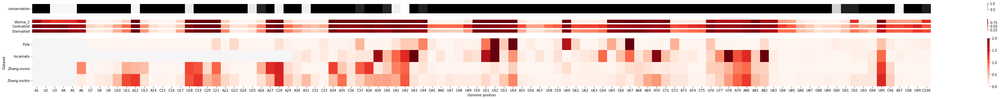

In [119]:
data1 = shape_norm_for_heatmap_pyle_whole_genome[0:100]
data2 = shape_norm_for_heatmap_incarnato_whole_genome[0:100]
data3 = shape_norm_for_heatmap_zhang_invivo_whole_genome[0:100]
data4 = shape_norm_for_heatmap_zhang_invitro_whole_genome[0:100]
xaxis = xaxis_whole_genome[0:100]
conservation = conservation_whole_genome[0:100]
vienna_2 = punp_track_vienna_2[0:100]
contrafold = punp_track_contrafold[0:100]
eternafold = punp_track_eternafold[0:100]
data = np.array([data1, data2, data3, data4]) # First make a numpy array with your data

# Move the data from a numpy array to a DataFrame with row and column labels
data_df = pd.DataFrame(data=data, \
			index=["Pyle", "Incarnato", "Zhang-invivo", "Zhang-invitro"], \
			columns=xaxis)
mask = data_df.isnull() # Create a mask for all the "nan" values

# Now on to making the plot!
color_map = plt.cm.get_cmap('Reds') # Set up color scheme
color_map.set_bad("whitesmoke") # nan values will now be gray
fig,ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [1.1, 1.5, 5]},figsize=(60, 5))



#LNA and conservation track
lna_conservation_data = np.array([conservation]) #add lna
lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
			index=["conservation"], \
			columns=xaxis)
fig.subplots_adjust(wspace=0.01)
lna_conserv_heatmap = sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
for i in range(lna_conservation_data_df.shape[0] + 1):
	ax[0].axhline(i, color='white', lw=4)
lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)

'''Structure track
#structures_data = np.array([structure) 
structures_data_df = pd.DataFrame(data=structures_data, \
			index=["structure"], \
			columns=xaxis)

fig.subplots_adjust(wspace=0.01)
struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
for i in range(structures_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)'''
    
#New track:p(unp) track
punp_data = np.array([vienna_2, contrafold, eternafold]) 
punp_data_df = pd.DataFrame(data=punp_data, \
			index=["Vienna_2", "Contrafold", "Eternafold"], \
			columns=xaxis)
fig.subplots_adjust(wspace=0.01)
sns.heatmap(punp_data_df, cmap='Reds', ax=ax[1], xticklabels=False)
for i in range(punp_data_df.shape[0] + 1):
	ax[1].axhline(i, color='white', lw=4)
    
sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[2])
heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
plt.xlabel("Genome position") # X axis label
plt.ylabel("Dataset") # Y axis label
plt.gcf().subplots_adjust(bottom=0.19)
#plt.show
plt.savefig('heatmap_100nt.pdf')


In [147]:
shape_norm_for_heatmap_pyle_whole_genome_frag =([shape_norm_for_heatmap_pyle_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_pyle_whole_genome), 100)])

shape_norm_for_heatmap_incarnato_whole_genome_frag =([shape_norm_for_heatmap_incarnato_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_incarnato_whole_genome), 100)])

shape_norm_for_heatmap_zhang_invivo_whole_genome_frag =([shape_norm_for_heatmap_zhang_invivo_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_zhang_invivo_whole_genome), 100)])

shape_norm_for_heatmap_zhang_invitro_whole_genome_frag =([shape_norm_for_heatmap_zhang_invitro_whole_genome[i:i+100] for i in range(0, len(shape_norm_for_heatmap_zhang_invitro_whole_genome), 100)])



In [148]:
xaxis_whole_genome_frag =([xaxis_whole_genome[i:i+100] for i in range(0, len(xaxis_whole_genome), 100)])
conservation_whole_genome_frag =([conservation_whole_genome[i:i+100] for i in range(0, len(conservation_whole_genome), 100)])
punp_track_vienna_2_frag = ([punp_track_vienna_2[i:i+100] for i in range(0, len(punp_track_vienna_2), 100)])
punp_track_contrafold_frag = ([punp_track_contrafold[i:i+100] for i in range(0, len(punp_track_contrafold), 100)])
punp_track_eternafold_frag =([punp_track_eternafold[i:i+100] for i in range(0, len(punp_track_eternafold), 100)])

In [137]:
xaxis_whole_genome_frag =([xaxis_whole_genome[i:i+5000] for i in range(0, len(xaxis_whole_genome), 5000)])
conservation_whole_genome_frag =([conservation_whole_genome[i:i+5000] for i in range(0, len(conservation_whole_genome), 5000)])
punp_track_vienna_2_frag = ([punp_track_vienna_2[i:i+5000] for i in range(0, len(punp_track_vienna_2), 5000)])
punp_track_contrafold_frag = ([punp_track_contrafold[i:i+5000] for i in range(0, len(punp_track_contrafold), 5000)])
punp_track_eternafold_frag =([punp_track_eternafold[i:i+5000] for i in range(0, len(punp_track_eternafold), 5000)])

In [138]:
shape_norm_for_heatmap_pyle_whole_genome_frag =([shape_norm_for_heatmap_pyle_whole_genome[i:i+5000] for i in range(0, len(shape_norm_for_heatmap_pyle_whole_genome), 5000)])

shape_norm_for_heatmap_incarnato_whole_genome_frag =([shape_norm_for_heatmap_incarnato_whole_genome[i:i+5000] for i in range(0, len(shape_norm_for_heatmap_incarnato_whole_genome), 5000)])

shape_norm_for_heatmap_zhang_invivo_whole_genome_frag =([shape_norm_for_heatmap_zhang_invivo_whole_genome[i:i+5000] for i in range(0, len(shape_norm_for_heatmap_zhang_invivo_whole_genome), 5000)])

shape_norm_for_heatmap_zhang_invitro_whole_genome_frag =([shape_norm_for_heatmap_zhang_invitro_whole_genome[i:i+5000] for i in range(0, len(shape_norm_for_heatmap_zhang_invitro_whole_genome), 5000)])



/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/matrix.py:203: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/matrix.py:208: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


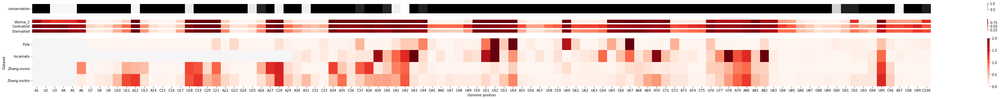

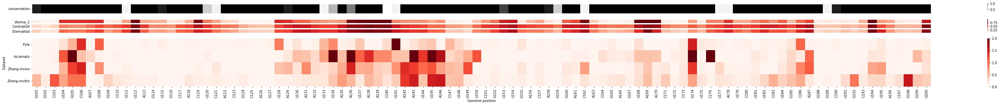

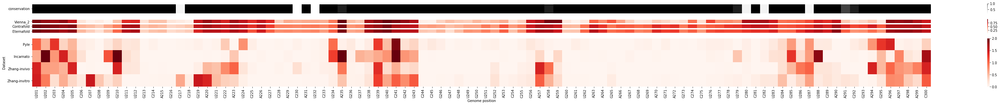

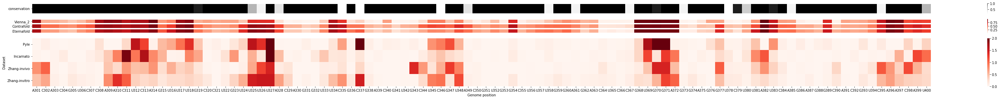

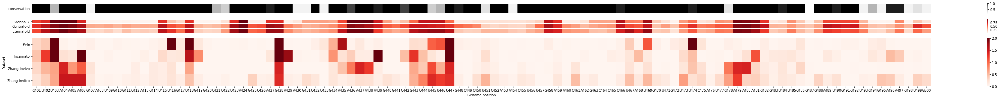

...

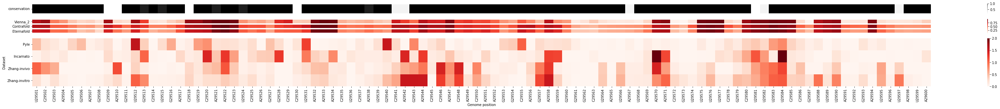

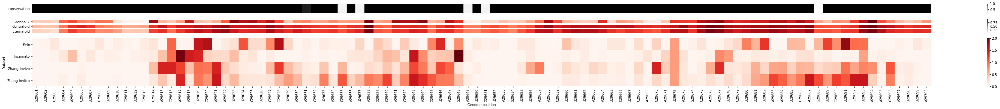

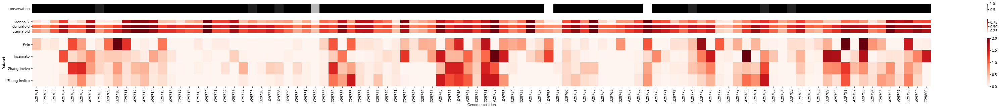

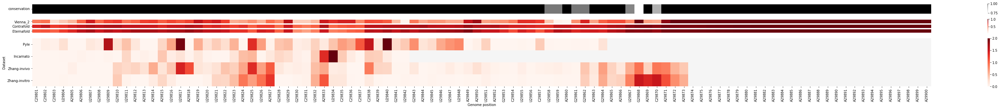

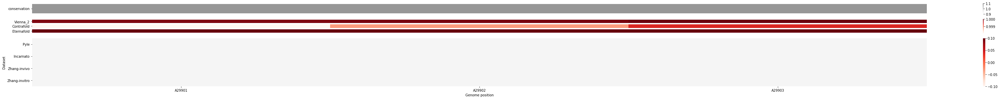

In [150]:
import matplotlib as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages('heatmap_whole_genome_100nt.pdf')

#pp.savefig()
#pp.close()
for idx in range(len(shape_norm_for_heatmap_pyle_whole_genome_frag)):
    data1 = shape_norm_for_heatmap_pyle_whole_genome_frag[idx]
    data2 = shape_norm_for_heatmap_incarnato_whole_genome_frag[idx]
    data3 = shape_norm_for_heatmap_zhang_invivo_whole_genome_frag[idx]
    data4 = shape_norm_for_heatmap_zhang_invitro_whole_genome_frag[idx]
    xaxis = xaxis_whole_genome_frag[idx]
    conservation = conservation_whole_genome_frag[idx]
    vienna_2 = punp_track_vienna_2_frag[idx]
    contrafold = punp_track_contrafold_frag[idx]
    eternafold = punp_track_eternafold_frag[idx]
    data = np.array([data1, data2, data3, data4]) # First make a numpy array with your data

    # Move the data from a numpy array to a DataFrame with row and column labels
    data_df = pd.DataFrame(data=data, \
                index=["Pyle", "Incarnato", "Zhang-invivo", "Zhang-invitro"], \
                columns=xaxis)
    mask = data_df.isnull() # Create a mask for all the "nan" values

    # Now on to making the plot!
    color_map = plt.cm.get_cmap('Reds') # Set up color scheme
    color_map.set_bad("whitesmoke") # nan values will now be gray
    fig,ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [1.1, 1.5, 5]},figsize=(60, 5))



    #LNA and conservation track
    lna_conservation_data = np.array([conservation]) #add lna
    lna_conservation_data_df = pd.DataFrame(data=lna_conservation_data, \
                index=["conservation"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    lna_conserv_heatmap = sns.heatmap(lna_conservation_data_df, cmap='Greys', ax=ax[0], xticklabels=False)
    for i in range(lna_conservation_data_df.shape[0] + 1):
        ax[0].axhline(i, color='white', lw=4)
    lna_conserv_heatmap.set_yticklabels(lna_conserv_heatmap.get_yticklabels(),va='center', rotation=0)

    '''Structure track
    #structures_data = np.array([structure) 
    structures_data_df = pd.DataFrame(data=structures_data, \
                index=["structure"], \
                columns=xaxis)

    fig.subplots_adjust(wspace=0.01)
    struc_heatmap = sns.heatmap(structures_data_df, cmap=color_map, vmax=2, ax=ax[1], xticklabels=False)
    for i in range(structures_data_df.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)
    struc_heatmap.set_yticklabels(struc_heatmap.get_yticklabels(),va='center', rotation=0)'''

    #New track:p(unp) track
    punp_data = np.array([vienna_2, contrafold, eternafold]) 
    punp_data_df = pd.DataFrame(data=punp_data, \
                index=["Vienna_2", "Contrafold", "Eternafold"], \
                columns=xaxis)
    fig.subplots_adjust(wspace=0.01)
    sns.heatmap(punp_data_df, cmap='Reds', ax=ax[1], xticklabels=False)
    for i in range(punp_data_df.shape[0] + 1):
        ax[1].axhline(i, color='white', lw=4)

    sns.heatmap(data_df, mask=mask, cmap=color_map, ax=ax[2])
    heat_map.set_yticklabels(heat_map.get_yticklabels(),va='center',)
    plt.xlabel("Genome position") # X axis label
    plt.ylabel("Dataset") # Y axis label
    plt.gcf().subplots_adjust(bottom=0.19)
    pp.savefig()
pp.close()

In [128]:
import matplotlib.backends.backend_pdf
pdf = matplotlib.backends.backend_pdf.PdfPages("heatmap_2000nt.pdf")
for fig in (1, figure(10).number): ## will open an empty extra figure :(
    pdf.savefig( fig )
pdf.close()

NameError: name 'xrange' is not defined

In [ ]:
import matplotlib as plt
plt.rcParams.update({'figure.max_open_warning': 0})

In [ ]:
for idx in range(len(frag_genome120)):
    sequence=frag_genome120[idx]
    current_shape_signal =frag_float_lines[idx]
    
    mfe_rnastructure= mfe(sequence, package='rnastructure', T=24, shape_signal=current_shape_signal)
    print('MFE with SHAPE signal:\n%s' % mfe_rnastructure)

In [ ]:
data1 = shape_norm_for_heatmap_mid4_das
data2 = shape_norm_for_heatmap_mid4_pyle
data3 = shape_norm_for_heatmap_mid4_incarnato
data4 = shape_norm_for_heatmap_mid4_zhang_invivo
data5 = shape_norm_for_heatmap_mid4_zhang_invitro
xaxis = xaxis_mid4
lna = mid4_lna
conservation = conservation_mid4
structure = structure_track_mid4
vienna_2 = punp_track_vienna_2_mid4
contrafold = punp_track_contrafold_mid4
eternafold = punp_track_eternafold_mid4

function_for_mid_heatmaps()